# **Final Project**
**KAIST, Spring 2021**   
**[CoE202(A)] Fundamentals of Artificial Intelligence**

**Instructor: Prof. Young-Gyu Yoon**

**Issue date: 2021.05.20.**    
**Due date: 2021.06.15.**

We are going to design a **convolutional neural network** for **semantic segmentation** of photographic images.

The goal is to achieve as high as possible mean Intersection of Union(mIoU) on the test dataset

For more information, please read the project specification document.
Reading this article below also may be helpful for understanding the problem.
(https://medium.com/analytics-vidhya/introduction-to-semantic-image-segmentation-856cda5e5de8)

This iPython notebook is the skeleton code prepared by our TAs (Changyeop Shin and Seungjae Han) for you.

In [ ]:
!pip install -U git+https://github.com/albu/albumentations --no-cache-dir # update albumentations library for image augmentation

  Cloning https://github.com/albu/albumentations to /tmp/pip-req-build-ujtjgk8o
  Running command git clone -q https://github.com/albu/albumentations /tmp/pip-req-build-ujtjgk8o
  Created wheel for albumentations: filename=albumentations-1.0.0-cp37-none-any.whl size=98151 sha256=bb098d9830215f31249dcbea7f88c94597198eb458411c09b3ab1f171dc6d933
  Stored in directory: /tmp/pip-ephem-wheel-cache-vl14lfdw/wheels/45/8b/e4/2837bbcf517d00732b8e394f8646f22b8723ac00993230188b
Successfully built albumentations
  Found existing installation: albumentations 0.1.12
    Uninstalling albumentations-0.1.12:
      Successfully uninstalled albumentations-0.1.12


**1. Import external libraries that we want to use.**

In [1]:
import os
import sys
import time
import datetime
from PIL import Image, ImageEnhance
import matplotlib.pyplot as plt
import numpy as np
import math
import torch
import torch.nn as nn
from torchvision.utils import save_image
import torchvision.transforms as transforms
from tqdm.auto import tqdm
import torch.nn.functional as F
import urllib
import glob
import skimage.io as skio
from torch.utils.data import Dataset
import random
import albumentations as A


!rm /etc/localtime
!ln -s /usr/share/zoneinfo/Asia/Seoul /etc/localtime

In [ ]:
EXTENSIONS = ['.jpg', '.png']

def load_image(file):
    return Image.open(file)

def is_image(filename):
    return any(filename.endswith(ext) for ext in EXTENSIONS)

def image_path(root, basename, extension):
    return os.path.join(root, f'{basename}{extension}')

def image_basename(filename):
    return os.path.basename(os.path.splitext(filename)[0])

class Relabel:
    def __init__(self, inlabel, outlabel):
        self.inlabel = inlabel
        self.outlabel = outlabel

    def __call__(self, tensor):
        tensor[tensor == self.inlabel] = self.outlabel
        return tensor

class ToLabel:
    def __call__(self, image):
        return torch.from_numpy(np.array(image)).long().unsqueeze(0)


def colormap(n):
    cmap=np.zeros([n, 3]).astype(np.uint8)

    for i in np.arange(n):
        r, g, b = np.zeros(3)

        for j in np.arange(2):
            r = r + (1<<(7-j))*((i&(1<<(3*j))) >> (3*j))
            g = g + (1<<(7-j))*((i&(1<<(3*j+1))) >> (3*j+1))
            b = b + (1<<(7-j))*((i&(1<<(3*j+2))) >> (3*j+2))

        cmap[i,:] = np.array([r, g, b])

    return cmap

class Colorize:
    def __init__(self, n=9):
        self.cmap = colormap(10)
        self.cmap[n] = self.cmap[-1]
        self.cmap = torch.from_numpy(self.cmap[:n])


    def __call__(self, gray_image): # convert from 2D label into 2D image of colorized label
        size = gray_image.size()
        color_image = torch.ByteTensor(3, size[1], size[2]).fill_(0)

        for label in range(1, len(self.cmap)):
            mask = gray_image[0] == label

            color_image[0][mask] = self.cmap[label][0]
            color_image[1][mask] = self.cmap[label][1]
            color_image[2][mask] = self.cmap[label][2]

        return color_image


class CoE_Dataset(Dataset):

    def __init__(self, root, input_transform=None, target_transform=None, _train=False):
        self.images_root = os.path.join(root, 'Images')
        self.labels_root = os.path.join(root, 'Labels')
        self._train = _train

        self.filenames = [image_basename(f)
            for f in os.listdir(self.labels_root) if is_image(f)]

        random.shuffle(self.filenames)

        self.input_transform = input_transform
        self.target_transform = target_transform
        self.A_transform = A.Compose([
            A.Rotate(limit=40, p=0.9), 
            A.HorizontalFlip(p=0.5), 
            A.RGBShift(r_shift_limit=25, g_shift_limit=25, b_shift_limit=25, p=0.9),
            A.OneOf([
                A.Blur(blur_limit=2, p=0.5), 
                A.ColorJitter(p=0.5)
            ], p=1.0)
        ])

    def spm_transform(self, image, label): 
#         image = ImageEnhance.Sharpness(image)
#         image = image.enhance(random.uniform(1, 4))
        
        image = image.resize((256, 256))
        label = label.resize((256, 256))
        
#         if (random.uniform(0, 1) > 0.5) and (self._train == True): 
#             image = image.transpose(Image.FLIP_LEFT_RIGHT)
#             label = label.transpose(Image.FLIP_LEFT_RIGHT)
            
#             deg = random.uniform(-30, 30)
#             image = image.rotate(deg)
#             label = label.rotate(deg)
        if self._train == True: 
            image = np.array(image)
            label = np.array(label)
            augmented = self.A_transform(image=image, mask=label)
            image = Image.fromarray(augmented['image']).convert('RGB')
            label = Image.fromarray(augmented['mask']).convert('P')
        
        return image, label
    
    def __getitem__(self, index):
        filename = self.filenames[index]
        with open(image_path(self.images_root, filename, '.jpg'), 'rb') as f:
            image = load_image(f).convert('RGB')
        with open(image_path(self.labels_root, filename, '.png'), 'rb') as f:
            label = load_image(f).convert('P')
        
        image, label = self.spm_transform(image, label)
        
        if self.input_transform is not None:
            image = self.input_transform(image)
        if self.target_transform is not None:
            label = self.target_transform(label)

        return image, label, filename

    def __len__(self):
        return len(self.filenames)


def batch_intersection_union(output, target, nclass):
    """mIoU"""
    # inputs are numpy array, output 4D, target 3D
    epsilon = 1e-12
    mini = 1
    maxi = nclass
    nbins = nclass
    predict = torch.argmax(output, 1) + 1
    target = target.float() + 1

    predict = predict.float() * (target > 0).float()
    intersection = predict * (predict == target).float()
    # areas of intersection and union
    # element 0 in intersection occur the main difference from np.bincount. set boundary to -1 is necessary.
    area_inter = torch.histc(intersection.cpu(), bins=nbins, min=mini, max=maxi)
    area_pred = torch.histc(predict.cpu(), bins=nbins, min=mini, max=maxi)
    area_lab = torch.histc(target.cpu(), bins=nbins, min=mini, max=maxi)
    area_union = area_pred + area_lab - area_inter
    assert torch.sum(area_inter > area_union).item() == 0, "Intersection area should be smaller than Union area"
    
    return area_inter.float(), area_union.float() + epsilon

In [2]:
seed = 1
torch.manual_seed(seed)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


**2. Mount the google drive.**

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

# Autoreload in case that the custom modules are changed
%load_ext autoreload
%autoreload 2

Mounted at /content/drive


**3. Import custom modules.
Below is a list of python modules that contain useful functions.**

**You need to make sure that you upload the files on 'filepath'.**

*  **util.py** : dataloader, mIoU calculator, transform functions.
*  **model_baseline.py**: semantic segmentation model.

In [ ]:
experiment = 'exp_colab'
data_filepath = r"/content/drive/My Drive/KAIST/Academic_Courses/CoE202/SourceCode/final_project" 
save_filepath = r"/content/drive/My Drive/KAIST/Academic_Courses/CoE202/SourceCode/final_project"
train_image_save_path = f'{save_filepath}/results/training'
val_image_save_path = f'{save_filepath}/results/validation'
model_save_path = f'{save_filepath}/{experiment}'
sys.path.append(data_filepath)

# from util import *
# from model_baseline import *

**4. Unzip the compressed data file (.zip).**

In [ ]:
# Check the current filepath and file lists in there
# %cd $data_filepath 
# !pwd 
# !ls 
# ![ -d "Custom_dataset" ] &&  echo "Directory $d found." || unzip -q Custom_dataset.zip # once you unzip, then do not again
# !ls

**5. Define arguments such as hyper-parameters, environment variables.**

In [ ]:
n_epoch = 200 # number of training epochs
batch_size = 40
learning_rate = 1e-3
crop_size = 256
experiment = "exp_colab"  # the name of experiment to save your model and optimizer.

# Make directories for saving outcomes of experiment
os.makedirs(f"{save_filepath}/{experiment}", exist_ok=True)
os.makedirs(f"{save_filepath}/results/training", exist_ok=True)
os.makedirs(f"{save_filepath}/results/validation", exist_ok=True)

**6. Load training and validation datasets with data transform functions.**

In [ ]:
# Class information
classes = ['background',
'aeroplane',
'bicycle',
'boat',
'bus',
'car',
'motorbike',
'person',
'train',
'boundary'] # For convenience, the classes are denoted as corresponding indexes (0~9) in this project
# Notice that the boundary class (index : 9) is ignored to evaluate mIoU!

color_transform = Colorize() # mapping probability maps to color maps


# You can modify custom transform functions
custom_transform = []

# Don't change input_transform, target_transform
# transforms.ColorJitter(0.5, 0.5, 0.5, 0.5),
# , transforms.Normalize((0.4546, 0.4543, 0.4447), (0.2742, 0.2698, 0.2869))
train_input_transform = [transforms.ToTensor(), transforms.Normalize((0.4546, 0.4543, 0.4447), (0.2742, 0.2698, 0.2869))]
val_input_transform = [transforms.ToTensor(), transforms.Normalize((0.4546, 0.4543, 0.4447), (0.2742, 0.2698, 0.2869))]

target_transform = [ToLabel(),
    Relabel(4, 3),
    Relabel(6, 4),
    Relabel(7, 5),
    Relabel(14, 6),
    Relabel(15, 7),
    Relabel(19, 8),
    Relabel(255, 9),
]

train_input_transform = transforms.Compose(custom_transform + train_input_transform)
val_input_transform = transforms.Compose(custom_transform + val_input_transform)
target_transform = transforms.Compose(custom_transform + target_transform)

# dataset = CoE_Dataset(root=f"{filepath}/CoE202Spring_finalproject_dataset",
#                 input_transform=input_transform,
#                 target_transform=target_transform)

train_dataset = CoE_Dataset(root=f"{data_filepath}/Custom_dataset/train",
                input_transform=train_input_transform,
                target_transform=target_transform,
                _train=True)
valid_dataset = CoE_Dataset(root=f"{data_filepath}/Custom_dataset/validation",
                input_transform=val_input_transform,
                target_transform=target_transform)

print('Total number of images : {}'.format(len(train_dataset) + len(valid_dataset)))

# ------------
# Load dataset
# ------------

# You can change dataset spliting/loading strategies
# n_train = math.floor(0.9*len(dataset)) # (default) 90% of the data for training
# n_val = len(dataset) - math.floor(0.9*len(dataset)) # (default) 10% of the data for validation

# train_dataset, valid_dataset = torch.utils.data.random_split(dataset, [n_train, n_val])

train_loader = torch.utils.data.DataLoader(train_dataset,
                                        batch_size=batch_size,
                                        shuffle=True,
                                        drop_last=True
                                        )
valid_loader = torch.utils.data.DataLoader(valid_dataset,
                                        batch_size=batch_size,
                                        shuffle=False,
                                        drop_last=True
                                        )

# Print the size of image/mask and unique classes (0~9)
img, mask, _ = next(iter(train_loader))
print('image & mask size : {}, {}'.format(img.size(), mask.size())) # size of the image and mask
print(torch.unique(mask)) # unique classes

Total number of images : 4600
image & mask size : torch.Size([40, 3, 256, 256]), torch.Size([40, 1, 256, 256])
tensor([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])


**7. Glance at some sample data.**

As the 1st step of learning process, it's indispensable to understand input data.

Then, we can get some hints for designing the network and training scheme.

Text(0.5, 0.98, 'Sample images')

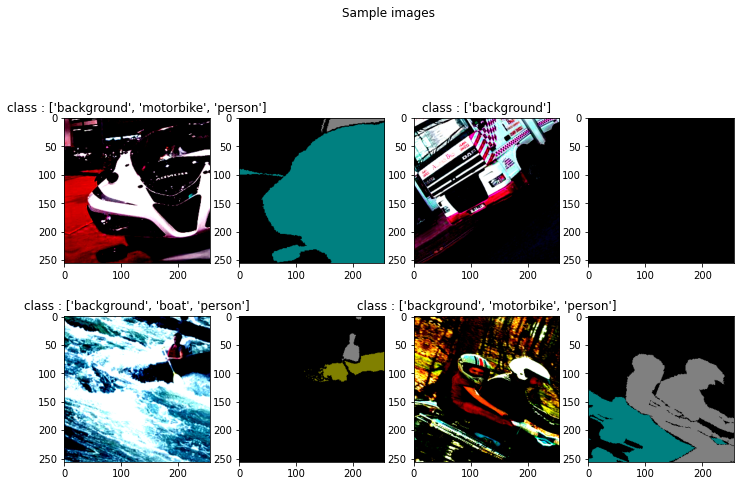

In [ ]:
(sample_batch, sample_label, _) = next(iter(train_loader))

fig = plt.figure(figsize=(12, 14))
for i in range(2):
    for j in range(2):
        fig.add_subplot(4, 4, (i * 4 + j * 2 + 1))
        plt.imshow(sample_batch[i*4+j].permute(1, 2, 0))
        classes_name = [classes[index] for index in torch.unique(sample_label[i*4+j]) if not index == 9]
        plt.title('class : ' + str(classes_name))
        fig.add_subplot(4, 4, (i * 4 + j * 2 + 1+ 1))
        plt.imshow(color_transform(sample_label[i*4+j]).permute(1, 2, 0))
plt.suptitle("Sample images")

In [ ]:
class Down(nn.Module):

    def __init__(self, in_channels, out_channels, dropout=False):
        super().__init__()
        layers = [
            nn.Conv2d(in_channels, out_channels, 3, 1, 1), 
            nn.BatchNorm2d(out_channels), 
            nn.ReLU(),
            nn.Conv2d(out_channels, out_channels, 3, 1, 1), 
            nn.BatchNorm2d(out_channels), 
            nn.ReLU(),
        ]
        if dropout:
            layers += [nn.Dropout(.5)]
        layers += [nn.MaxPool2d(kernel_size=2, stride=2)]
        
        self.down = nn.Sequential(*layers)

    def forward(self, x):
        return self.down(x)
    
class Up(nn.Module):

    def __init__(self, in_channels, out_channels, dropout=False):
        super().__init__()
        layers = [
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2, padding=0),
            nn.ReLU(),
        ]
        self.up = nn.Sequential(*layers)

        layers = [
            nn.Conv2d(2*out_channels, out_channels, 3, 1, 1), 
            nn.BatchNorm2d(out_channels), 
            nn.ReLU(),
        ]
        if dropout:
            layers += [nn.Dropout(.5)]
        self.conv = nn.Sequential(*layers)
        
    def forward(self, x_old, x_new):
        x_new = self.up(x_new)
        x = torch.cat([x_old, x_new], dim=1)
        return self.conv(x)
    
class Inp(nn.Module):

    def __init__(self, in_channels, out_channels, dropout=False):
        super().__init__()
        layers = [
            nn.Conv2d(in_channels, out_channels, 3, 1, 1), 
            nn.BatchNorm2d(out_channels), 
            nn.ReLU(),
            nn.Conv2d(out_channels, out_channels, 3, 1, 1), 
            nn.BatchNorm2d(out_channels), 
            nn.ReLU(),
        ]
        if dropout:
            layers += [nn.Dropout(.5)]
        self.inp = nn.Sequential(*layers)

    def forward(self, x):
        return self.inp(x)
    
class UNet(nn.Module): 
    def __init__(self): 
        super().__init__()
        
        # input = B * 3 * 128 * 128
        # output = B * 128 * 128
        
        self.inp = Inp(3, 10)
        self.en1 = Down(10, 32)
        self.en2 = Down(32, 64)
        self.en3 = Down(64, 128)
        self.en4 = Down(128, 256)
        self.en5 = Down(256, 512, dropout=False)
        self.en6 = Down(512, 1024)
#         self.en7 = Down(480*2, 480*4)
        
#         self.dec1 = Up(480*4, 480*2)
        self.dec2 = Up(1024, 512)
        self.dec3 = Up(512, 256)
        self.dec4 = Up(256, 128)
        self.dec5 = Up(128, 64)
        self.dec6 = Up(64, 32, dropout=False)
        self.dec7 = Up(32, 10)
        
        self.dropout = nn.Dropout(0.5)
        
    def forward(self, x): 
        inp = self.inp(x)
        en1 = self.en1(inp) # 32
        en2 = self.en2(en1) # 64
        en3 = self.en3(en2) # 128
        en4 = self.en4(en3) # 256
        en5 = self.en5(en4) # 512
        en6 = self.en6(en5) # 1024
        # center
        dec2 = self.dec2(en5, en6) # 512
        dec3 = self.dec3(en4, dec2) # 256
        dec4 = self.dec4(en3, dec3) # 128
        dec5 = self.dec5(en2, dec4) # 64
        dec6 = self.dec6(en1, dec5) # 32
        dec7 = self.dec7(inp, dec6) # 10
        
        return dec7

**8. Set-up the training environment (model, loss function, optimizer, etc).**


In [ ]:
# You can modify the loss, the model and the optimizer
criterion = nn.CrossEntropyLoss(ignore_index=9).to(device) # Ignore the index 9 indiciating 'boundaries' for calculating loss
model = UNet().to(device)
optim = torch.optim.Adam(model.parameters(), lr = learning_rate)

best_model_state, best_optim_state = None, None
latest_model_state, latest_optim_state = None, None

In [ ]:
# def weights_init_uniform_rule(m):
#     if (type(m) == nn.Conv2d) or (type(m) == nn.ConvTranspose2d):
#         m.weight.data.uniform_(-0.5, 0.5)
#         m.bias.data.fill_(0)

# model.apply(weights_init_uniform_rule)

**9. Check your segmentation network.**

You can define your own network in **model_baseline.py.** 

In [ ]:
print('The network architecture is as follows.')
print(model)

def get_n_params(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)
print('total parameters = ', get_n_params(model))

The network architecture is as follows.
UNet(
  (inp): Inp(
    (inp): Sequential(
      (0): Conv2d(3, 10, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(10, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Conv2d(10, 10, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(10, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU()
    )
  )
  (en1): Down(
    (down): Sequential(
      (0): Conv2d(10, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU()
      (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
  )
  (en2): Down(
    (down): Se

In [ ]:
# (images, labels, _) = next(iter(train_loader))
# images, labels = images.to(device), labels.to(device)
# pred = model(images)
# print(pred)

**10. Monitor learning process in the Tensorboard.**

Tensorboard is a visualization toolkit (part of tensorflow) that help us monitor the learning procedures (loss, accuracy, etc). 

We are using PyTorch here, but we can still use the Tensorboard!

*   We will execute the Tensorboard now. At this point, we will get 'No dashboards are active for the current data set.' message, as nothing is connected to this board.
*   In the training for-loop below, there is summary.scalar() function which writes specific scalars to the Tensorboard!
*   You can click the refresh button in the Tensorboard, or set automatic refresh, 'Reload data' in the setting!

In [ ]:
%load_ext tensorboard
from tensorflow import summary
current_time = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
summary_writer = summary.create_file_writer(f"{save_filepath}/runs/{current_time}") # {save_filepath}/runs/{current_time}
# remember to change above dir to save_filepath/runs/{}

%tensorboard --logdir="{save_filepath}/runs" # you can manually remove unnecessary logs in this folder

<IPython.core.display.Javascript object>

In [ ]:
print(datetime.datetime.now())

2021-06-09 10:18:31.020984


**11. Train your segmentation network.**

You can monitor the training procedure through the Tensorboard above.

In [ ]:
train_loss_iter = np.zeros(n_epoch, dtype=float)  # Temporary numpy array to save loss for each epoch
validation_loss_iter = np.zeros(n_epoch, dtype=float)
train_mIoU_iter = np.zeros(n_epoch, dtype=float)  # Temporary numpy array to save accuracy for each epoch
validation_mIoU_iter = np.zeros(n_epoch, dtype=float)

start = time.time()
lst_time = time.time()
best_mIoU = 0.0
for epoch in range(n_epoch):

    train_total_loss, valid_total_loss = 0.0, 0.0

    # # --------------
    # # Training step
    # # --------------

    model.train()

    # Load mini-batches and do training
    total_inter = 0
    total_union = 0
    # At first loading, it may be stuck for a while..
    train_total_cnt = 0
    for _, (images, labels, _) in enumerate(train_loader):
        
        images = images.to(device)
        labels = labels.to(device)
        # Predict the pixel-wise probability map indicating class prediction
        pred = model(images)

        # Calculate loss
        loss = criterion(pred, labels[:, 0, :, :])
        
        # Backpropagate the loss to update network's weights
        optim.zero_grad()
        loss.backward()
        optim.step()

        train_total_loss += loss.item()
        train_total_cnt += len(labels)
        
        # Calculate total intersection and union for each epoch
        area_inter, area_union = batch_intersection_union(pred, labels[:, 0, :, :], 9)
        total_inter += area_inter
        total_union += area_union
    train_IoU_class = total_inter / total_union # indicate the IoU for each classes(bins)
    train_mIoU = train_IoU_class.mean().item() # indicate the mean IoU across all classes

    train_loss_iter[epoch] = (train_total_loss / train_total_cnt)
    train_mIoU_iter[epoch] = train_mIoU
    
    if epoch % 100 == 0 or epoch == n_epoch - 1:
        stacked_imgs = torch.cat(torch.split(images, 1, dim=0), dim=3)
        stacked_labels = torch.cat(torch.split(labels, 1, dim=0), dim=3)[0]
        stacked_preds = torch.cat(torch.split(pred, 1, dim=0), dim=3)[0]
        img_grid = torch.cat((stacked_imgs, color_transform(stacked_labels).unsqueeze(0).cuda(),color_transform(stacked_preds.max(0)[1].unsqueeze(0)).unsqueeze(0).cuda()), -2)
        save_image(img_grid, f"{train_image_save_path}/train_%d.png" % epoch, normalize=False)
    
    # ----------------
    # Validation step
    # ----------------

    # For validation, you do not need to calculate the gradient
    with torch.no_grad():
        model.eval()
        total_inter = 0
        total_union = 0
        # Load mini-batches and do validation
        val_total_cnt = 0
        for _, (images, labels, _) in enumerate(valid_loader):
            images = images.to(device)
            labels = labels.to(device)

            pred = model(images)
            loss = criterion(pred, labels[:, 0, :, :])

            valid_total_loss += loss.item()
            val_total_cnt += len(labels)

            # Calculate total intersection and union for each epoch
            area_inter, area_union = batch_intersection_union(pred, labels[:, 0, :, :], 9)
            total_inter += area_inter
            total_union += area_union
        val_IoU_class = total_inter / total_union # indicate the IoU for each classes(bins)
        val_mIoU = val_IoU_class.mean().item() # indicate the mean IoU across all classes

        validation_loss_iter[epoch] = (valid_total_loss / val_total_cnt)
        validation_mIoU_iter[epoch] = val_mIoU
        
        # Record the losses in forms of tensorboard scalars
        with summary_writer.as_default():
            summary.scalar('train_loss', (train_total_loss / train_total_cnt), step=epoch)
            summary.scalar('valid_loss', (valid_total_loss / val_total_cnt), step=epoch)
            summary.scalar('train_mIoU', train_mIoU, step=epoch)
            summary.scalar('val_mIoU', val_mIoU, step=epoch)

        # Store the latest and best accuracy models and optimizers
        latest_model_state = model.state_dict()
        latest_optim_state = optim.state_dict()
        
        if best_mIoU < val_mIoU:
            best_mIoU = val_mIoU
            best_model_state = model.state_dict()
            best_optim_state = optim.state_dict()

    # Print training logs and save intermediate validation results during training
    if epoch % 10 == 0 or epoch == n_epoch - 1:
        print(f"""\n{time.strftime("%Y-%m-%d %H:%M:%S", time.localtime())} || sec/epoch={(time.time()-lst_time):.0f}sec || [{epoch}/{n_epoch}], train_loss = {(train_total_loss / train_total_cnt):.4f}, valid_loss = {(valid_total_loss / val_total_cnt):.4f}, train_mIoU = {train_mIoU:.4f}, val_mIoU = {val_mIoU:.4f}, , best mIoU = {best_mIoU:.4f}""")
    
    if epoch % 100 == 0 or epoch == n_epoch - 1:
        stacked_imgs = torch.cat(torch.split(images, 1, dim=0), dim=3)
        stacked_labels = torch.cat(torch.split(labels, 1, dim=0), dim=3)[0]
        stacked_preds = torch.cat(torch.split(pred, 1, dim=0), dim=3)[0]
        img_grid = torch.cat((stacked_imgs, color_transform(stacked_labels).unsqueeze(0).cuda(),color_transform(stacked_preds.max(0)[1].unsqueeze(0)).unsqueeze(0).cuda()), -2)
        save_image(img_grid, f"{val_image_save_path}/val_%d.png" % epoch, normalize=False)
    lst_time = time.time()

elapsed = time.time() - start
print(f"End of training, elapsed time : {elapsed // 60} min {elapsed % 60} sec.")


2021-06-09 10:20:53 || sec/epoch=142sec || [0/200], train_loss = 0.0510, valid_loss = 0.0527, train_mIoU = 0.0894, val_mIoU = 0.0705, , best mIoU = 0.0705

2021-06-09 10:34:09 || sec/epoch=80sec || [10/200], train_loss = 0.0312, valid_loss = 0.0367, train_mIoU = 0.1518, val_mIoU = 0.1367, , best mIoU = 0.1525

2021-06-09 10:47:20 || sec/epoch=79sec || [20/200], train_loss = 0.0226, valid_loss = 0.0209, train_mIoU = 0.2583, val_mIoU = 0.2830, , best mIoU = 0.2830

2021-06-09 11:00:32 || sec/epoch=79sec || [30/200], train_loss = 0.0171, valid_loss = 0.0180, train_mIoU = 0.3486, val_mIoU = 0.2796, , best mIoU = 0.3605

2021-06-09 11:13:40 || sec/epoch=79sec || [40/200], train_loss = 0.0135, valid_loss = 0.0133, train_mIoU = 0.4383, val_mIoU = 0.4206, , best mIoU = 0.4206

2021-06-09 11:26:47 || sec/epoch=78sec || [50/200], train_loss = 0.0105, valid_loss = 0.0126, train_mIoU = 0.5195, val_mIoU = 0.4281, , best mIoU = 0.4281

2021-06-09 11:39:56 || sec/epoch=79sec || [60/200], train_loss 

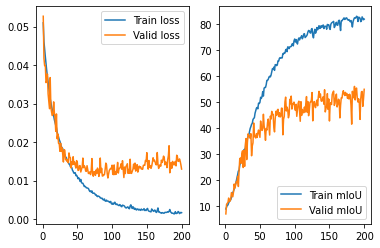

In [ ]:
plt.subplot(1, 2, 1)
plt.plot(range(1,n_epoch+1), train_loss_iter, label='Train loss')
plt.plot(range(1,n_epoch+1), validation_loss_iter, label='Valid loss')
plt.legend()

plt.subplot(1, 2, 2)
l1, = plt.plot(range(1,n_epoch+1), 100*train_mIoU_iter, label='Train mIoU')
l2, = plt.plot(range(1,n_epoch+1), 100*validation_mIoU_iter, label='Valid mIoU')
plt.legend()

plt.show()

In [ ]:
# l1, = plt.plot(range(1,n_epoch+1), 100*train_mIoU_iter)
# l2, = plt.plot(range(1,n_epoch+1), 100*validation_mIoU_iter)
# plt.legend(handles=(l1, l2), labels=('Train mIoU', 'Valid mIoU'))

**12. Save the predicted results for validation dataset.**

Also, let's check the validation mIoU.

In [ ]:
model.load_state_dict(best_model_state)
model.eval()
mIoU = 0.0
total_inter = 0
total_union = 0
valid_loader_save = torch.utils.data.DataLoader(valid_dataset,
                                        batch_size=1,
                                        shuffle=True,
                                        drop_last=True
                                        )

for _, (images, labels, filename) in enumerate(valid_loader_save):
      images = images.to(device)
      labels = labels.to(device)
      # Predict the pixel-wise probability map indicating class prediction
      pred = model(images)
      area_inter, area_union = batch_intersection_union(pred, labels[:, 0, :, :], 9)
      total_inter += area_inter
      total_union += area_union
      labels = color_transform(labels[0]).unsqueeze(0).cuda()
      pred = color_transform(pred[0].max(0)[1].unsqueeze(0)).unsqueeze(0).cuda()

      # Save the validation results to .png
#       save_image(images, f"{val_image_save_path}/{filename[0]}_img.png")
#       save_image(pred.float(), f"{val_image_save_path}/{filename[0]}_pred.png")
#       save_image(labels.float(), f"{val_image_save_path}/{filename[0]}_label.png")
mIoU = (total_inter / total_union).mean().item()
print('The final mIoU : {}'.format(mIoU))

The final mIoU : 0.5101609826087952


**13. Visualize the sample validation image in the shell.**

validation
torch.Size([3, 256, 256])
torch.Size([1, 256, 256])
torch.Size([1, 256, 256])
torch.Size([256, 256]) torch.Size([256, 256])
mIoU : 0.609154462814331
tensor([0, 8, 9])
torch.Size([3, 256, 256])
torch.Size([1, 256, 256])
torch.Size([1, 256, 256])
torch.Size([256, 256]) torch.Size([256, 256])
mIoU : 0.609154462814331
tensor([0, 7, 9])
torch.Size([3, 256, 256])
torch.Size([1, 256, 256])
torch.Size([1, 256, 256])
torch.Size([256, 256]) torch.Size([256, 256])
mIoU : 0.609154462814331
tensor([0, 7, 9])
torch.Size([3, 256, 256])
torch.Size([1, 256, 256])
torch.Size([1, 256, 256])
torch.Size([256, 256]) torch.Size([256, 256])
mIoU : 0.609154462814331
tensor([0, 5, 6, 7, 9])
torch.Size([3, 256, 256])
torch.Size([1, 256, 256])
torch.Size([1, 256, 256])
torch.Size([256, 256]) torch.Size([256, 256])
mIoU : 0.609154462814331
tensor([0, 7, 8, 9])


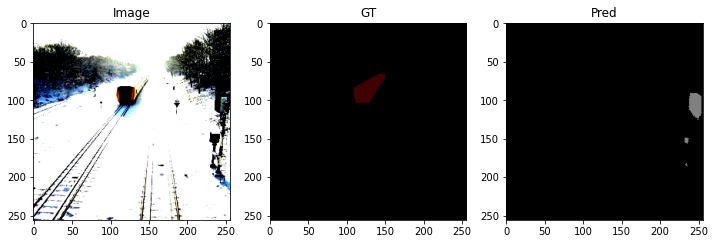

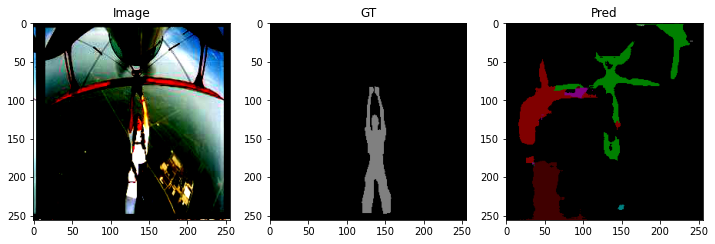

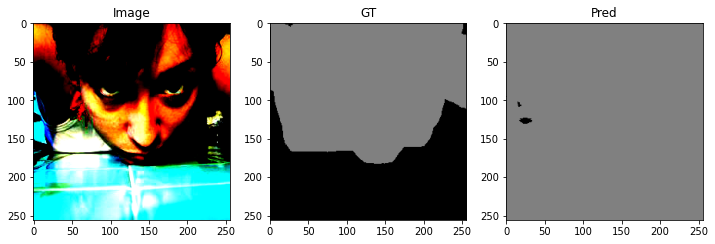

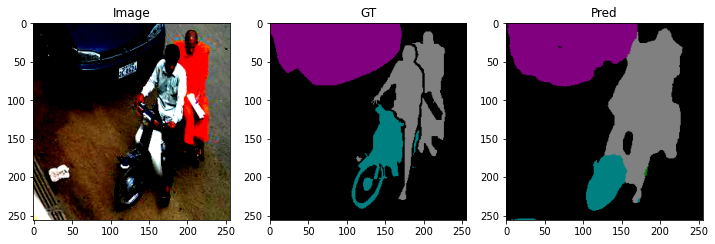

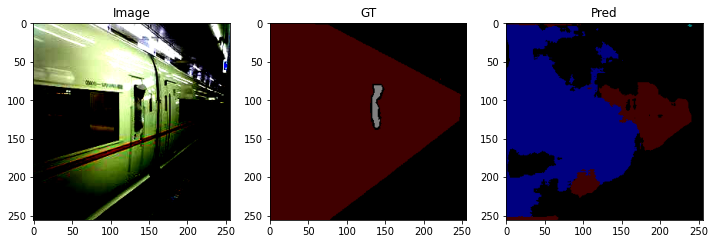

In [ ]:
# torch.cuda.memory_summary(device=None, abbreviated=False)

# torch.cuda.empty_cache()
# print("training")
# training_sample = True

# if training_sample == True:
#     (sample_batch, sample_label,_) = next(iter(train_loader))
# else:
#     (sample_batch, sample_label,_) = next(iter(valid_loader))



# model.eval()
# sample_batch
# sample_label
# sample_output = model(sample_batch.to(device))

# for index in range(5):
#     print(sample_batch[index].size())
#     print(sample_label[index].size())
#     print(sample_output[index].max(0)[1].unsqueeze(0).size())

#     label_one = sample_label[index].squeeze(0)
#     pred_one = sample_output[index].max(0)[1]
#     print(label_one.size(), pred_one.size())
#     with torch.no_grad():
#         inter, union = batch_intersection_union(sample_output, sample_label[:, 0, :, :].to(device), 9)
#         mIoU = (inter / union).mean().item()
#         print(f"mIoU : {mIoU}")

#     fig = plt.figure(figsize=(12, 12))
#     fig.add_subplot(1, 3, 1)
#     plt.imshow(sample_batch[index].permute(1, 2, 0))
#     plt.title("Image")
#     fig.add_subplot(1, 3, 2)
#     plt.imshow(color_transform(sample_label[index]).permute(1, 2, 0))
#     plt.title("GT")
#     print(torch.unique(sample_label[index]))
#     fig.add_subplot(1, 3, 3)
#     plt.imshow(color_transform(pred_one.unsqueeze(0)).permute(1, 2, 0))
#     plt.title("Pred")
    

torch.cuda.empty_cache()
print("validation")
training_sample = False

if training_sample == True:
    (sample_batch, sample_label,_) = next(iter(train_loader))
else:
    (sample_batch, sample_label,_) = next(iter(valid_loader))



model.eval()
sample_batch
sample_label
sample_output = model(sample_batch.to(device))

for index in range(5):
    print(sample_batch[index].size())
    print(sample_label[index].size())
    print(sample_output[index].max(0)[1].unsqueeze(0).size())

    label_one = sample_label[index].squeeze(0)
    pred_one = sample_output[index].max(0)[1]
    print(label_one.size(), pred_one.size())
    with torch.no_grad():
        inter, union = batch_intersection_union(sample_output, sample_label[:, 0, :, :].to(device), 9)
        mIoU = (inter / union).mean().item()
        print(f"mIoU : {mIoU}")

    fig = plt.figure(figsize=(12, 12))
    fig.add_subplot(1, 3, 1)
    plt.imshow(sample_batch[index].permute(1, 2, 0))
    plt.title("Image")
    fig.add_subplot(1, 3, 2)
    plt.imshow(color_transform(sample_label[index]).permute(1, 2, 0))
    plt.title("GT")
    print(torch.unique(sample_label[index]))
    fig.add_subplot(1, 3, 3)
    plt.imshow(color_transform(pred_one.unsqueeze(0)).permute(1, 2, 0))
    plt.title("Pred")

**14. Save parameters of the model and the optimizer.**

By default, it saves parameters of the latest and best model and optimizer.

Following your strategy, you can freely select them by yourself.

In [ ]:
if best_model_state is not None and best_optim_state is not None:
    torch.save(best_model_state, f"{model_save_path}/best_model_state_dict.pt")
    torch.save(best_optim_state, f"{model_save_path}/best_optim_state_dict.pt")
    torch.save(latest_model_state, f"{model_save_path}/latest_model_state_dict.pt")
    torch.save(latest_optim_state, f"{model_save_path}/latest_optim_state_dict.pt")
    print("Successfully saved.")

Successfully saved.
